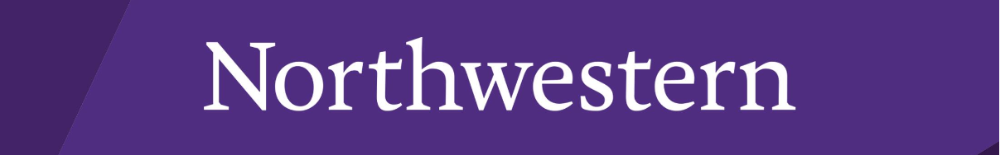

#Bahdanau Attention Encoder & Decoder Model
The idea of a global attentional model is to consider all the hidden states of the encoder hs when deriving the context vector ct . Bahdanau attention or additive attention takes concatenation of forward and backward source hidden state. 

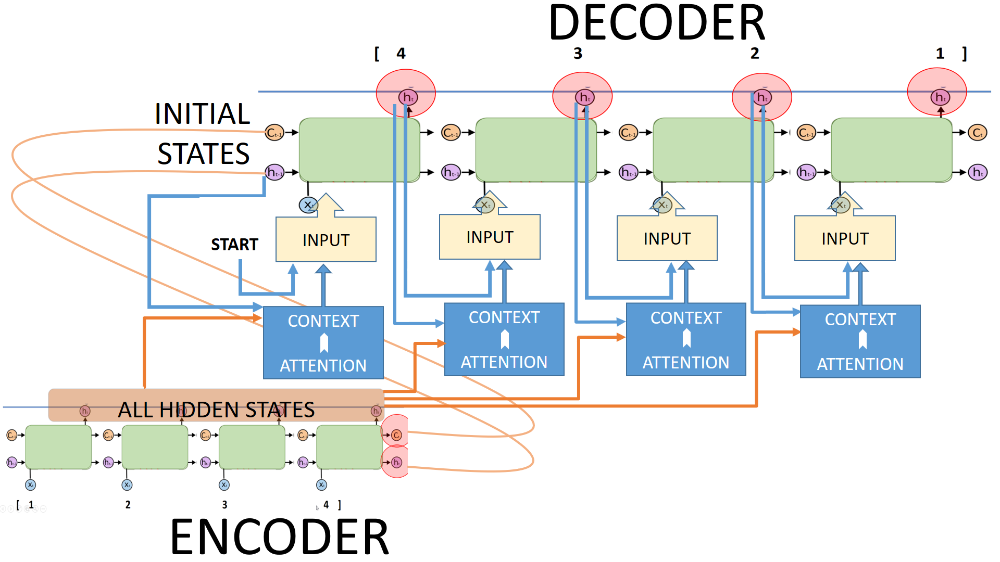


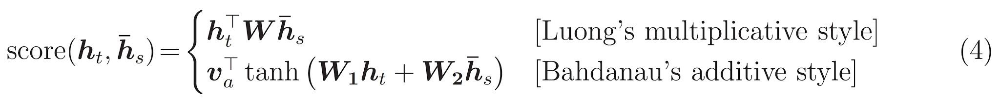


##Import packages

In [ ]:
#Ignore Warning
import warnings
warnings.filterwarnings("ignore") 
# set up notebook to display multiple outputs in one cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
import datetime
from packaging import version
import tarfile
from collections import Counter
import numpy as np
import pandas as pd
import time
import string
import os # Operation System
from tqdm import tqdm
import re
from PIL import Image
import pickle

from timeit import default_timer as timer
import time
from datetime import timedelta

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import cv2
from google.colab.patches import cv2_imshow

from sklearn.preprocessing import StandardScaler
import imgaug.augmenters as iaa
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import accuracy_score


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import TextVectorization
from tensorflow.keras.applications import densenet
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.preprocessing.text import Tokenizer
from nltk.translate.bleu_score import sentence_bleu
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk

## Verify TensorFlow version and Keras version

In [ ]:
print("This notebook requires TensorFlow 2.0 or above")
print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >=2
print("Keras version: ", keras.__version__)

This notebook requires TensorFlow 2.0 or above
TensorFlow version:  2.8.2
Keras version:  2.8.0


## Mount Google Drive to Colab environment

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/
!pwd
#!ls
print('Working Directory')
print(os.getcwd())
work_dir = "/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/"

/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4
/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4
Working Directory
/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4


## Utility Functions

In [ ]:
# Learning curve function to visualize accuracy and loss in train and validation set.
def draw_learning_curve(history, keys=['accuracy', 'loss']):
    plt.figure(figsize=(20,8))
    for i, key in enumerate(keys):
        plt.subplot(1, 2, i + 1)
        sns.lineplot(x = history.epoch, y = history.history[key])
        sns.lineplot(x = history.epoch, y = history.history['val_' + key])
        plt.title('Learning Curve')
        plt.ylabel(key.title())
        plt.xlabel('Epoch')
        plt.legend(['train', 'validation'], loc='best')
    plt.show()

In [ ]:
#Read the pickle files 
train_data = pd.read_pickle(work_dir + 'pickle_files/train.pkl')
val_data = pd.read_pickle(work_dir + 'pickle_files/val.pkl')
test_data = pd.read_pickle(work_dir + 'pickle_files/test.pkl')

In [ ]:
train_data.shape

(3605, 8)

In [ ]:
val_data.shape

(471, 8)

In [ ]:
test_data.shape

(563, 8)

In [ ]:
train_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute cardiopulmonary findings .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,11.xml,<CLS> no acute cardiopulmonary findings . <END>,<CLS> no acute cardiopulmonary findings .,no acute cardiopulmonary findings . <END>,162
1,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,324.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
2,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,504.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
3,no acute cardiopulmonary abnormalities .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2539.xml,<CLS> no acute cardiopulmonary abnormalities ....,<CLS> no acute cardiopulmonary abnormalities .,no acute cardiopulmonary abnormalities . <END>,134
4,no acute cardiopulmonary disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2061.xml,<CLS> no acute cardiopulmonary disease . <END>,<CLS> no acute cardiopulmonary disease .,no acute cardiopulmonary disease . <END>,136


In [ ]:
val_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute cardiopulmonary process .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2192.xml,<CLS> no acute cardiopulmonary process . <END>,<CLS> no acute cardiopulmonary process .,no acute cardiopulmonary process . <END>,87
1,no acute cardiopulmonary abnormalities .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2792.xml,<CLS> no acute cardiopulmonary abnormalities ....,<CLS> no acute cardiopulmonary abnormalities .,no acute cardiopulmonary abnormalities . <END>,134
2,no active disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,3701.xml,<CLS> no active disease . <END>,<CLS> no active disease .,no active disease . <END>,130
3,no acute disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1903.xml,<CLS> no acute disease . <END>,<CLS> no acute disease .,no acute disease . <END>,109
4,no acute cardiopulmonary findings .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,3838.xml,<CLS> no acute cardiopulmonary findings . <END>,<CLS> no acute cardiopulmonary findings .,no acute cardiopulmonary findings . <END>,162


In [ ]:
test_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute radiographic cardiopulmonary process .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,356.xml,<CLS> no acute radiographic cardiopulmonary pr...,<CLS> no acute radiographic cardiopulmonary pr...,no acute radiographic cardiopulmonary process ...,83
1,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2290.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
2,no acute pulmonary disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2979.xml,<CLS> no acute pulmonary disease . <END>,<CLS> no acute pulmonary disease .,no acute pulmonary disease . <END>,58
3,no acute findings,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1531.xml,<CLS> no acute findings <END>,<CLS> no acute findings,no acute findings <END>,30
4,negative for acute abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1347.xml,<CLS> negative for acute abnormality . <END>,<CLS> negative for acute abnormality .,negative for acute abnormality . <END>,30


In [ ]:
#tokenizer
tokenizer = Tokenizer(filters = '',oov_token = '<unk>') #setting filters to none
tokenizer.fit_on_texts(train_data.impression_final.values)
train_captions = tokenizer.texts_to_sequences(train_data.impression_final) 
test_captions = tokenizer.texts_to_sequences(test_data.impression_final) 
vocab_size = len(tokenizer.word_index)
caption_len = np.array([len(i) for i in train_captions])
start_index = tokenizer.word_index['<cls>'] #tokened value of <start>
end_index = tokenizer.word_index['<end>'] #tokened value of <end>

print('\nThe max and min value of "caption length" was found to be %i and %i respectively'%(max(caption_len),min(caption_len)))
print('The 80 percentile value of caption_len which is %i will be taken as the maximum padded value for each impression for faster training.'
%(np.percentile(caption_len,80)))
max_pad = int(np.percentile(caption_len,80))
del train_captions,test_captions #we will create tokenizing  and padding in-built in dataloader


The max and min value of "caption length" was found to be 135 and 3 respectively
The 80 percentile value of caption_len which is 30 will be taken as the maximum padded value for each impression for faster training.


##Modeling

Model architecture consists of three models:

1. A CNN: used to extract the image features
2. Encoder: The extracted image features are then passed to a Transformer.
3. Decoder: This model takes the encoder output and the text data.

In [ ]:
batch_size = 100
embedding_dim = 300
dense_dim = 512
lstm_units = dense_dim
dropout_rate = 0.2

In [ ]:
class Dataset():
  #here we will get the images converted to vector form and the corresponding captions. df  = dataframe containing image_1,image_2 and impression
  def __init__(self,df,input_size,tokenizer = tokenizer, augmentation = True,max_pad = max_pad): 
    self.image1 = df.image_1
    self.image2 = df.image_2
    self.caption = df.impression_ip #inp
    self.caption1 = df.impression_op  #output
    self.input_size = input_size #tuple ex: (224,224)
    self.tokenizer = tokenizer
    self.augmentation = augmentation
    self.max_pad = max_pad

    #image augmentation
    #https://imgaug.readthedocs.io/en/latest/source/overview/flip.html?highlight=Fliplr
    self.aug1 = iaa.Fliplr(1) #flip images horizontally
    self.aug2 = iaa.Flipud(1) #flip images vertically


  def __getitem__(self,i):
    #gets the datapoint at i th index, we will extract the feature vectors of images after resizing the image  and apply augmentation
    image1 = cv2.imread(self.image1[i],cv2.IMREAD_UNCHANGED)/255 
    image2 = cv2.imread(self.image2[i],cv2.IMREAD_UNCHANGED)/255 #here there are 3 channels
    image1 = cv2.resize(image1,self.input_size,interpolation = cv2.INTER_NEAREST)
    image2 = cv2.resize(image2,self.input_size,interpolation = cv2.INTER_NEAREST)
    if image1.any()==None:
      print("%i , %s image sent null value"%(i,self.image1[i]))
    if image2.any()==None:
      print("%i , %s image sent null value"%(i,self.image2[i]))


    #tokenizing and padding
    caption = self.tokenizer.texts_to_sequences(self.caption[i:i+1]) #the input should be an array for tokenizer ie [self.caption[i]] 

    caption = pad_sequences(caption,maxlen = self.max_pad,padding = 'post') #opshape:(input_length,)
    caption = tf.squeeze(caption,axis=0) #opshape = (input_length,) removing unwanted axis if present

    caption1 = self.tokenizer.texts_to_sequences(self.caption1[i:i+1]) #the input should be an array for tokenizer ie [self.caption[i]] 

    caption1 = pad_sequences(caption1,maxlen = self.max_pad,padding = 'post') #opshape: (input_length,)
    caption1 = tf.squeeze(caption1,axis=0) #opshape = (input_length,) removing unwanted axis if present




    if self.augmentation: #we will not apply augmentation that crops the image 
          a = np.random.uniform()
          if a<0.333:
              image1 = self.aug1.augment_image(image1)
              image2 = self.aug1.augment_image(image2)
          elif a<0.667:
              image1 = self.aug2.augment_image(image1)
              image2 = self.aug2.augment_image(image2)
          else: #applying no augmentation
            pass;

    
    return image1,image2,caption,caption1

    
  def __len__(self):
    return len(self.image1)


class Dataloader(tf.keras.utils.Sequence):     #for batching
    def __init__(self, dataset, batch_size=1, shuffle=True):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.dataset))

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        indexes = [self.indexes[j] for j in range(start,stop)] #getting the shuffled index values
        data = [self.dataset[j] for j in indexes] #taken from Data class (calls __getitem__ of Data) here the shape is batch_size*3, (image_1,image_2,caption)
        
        batch = [np.stack(samples, axis=0) for samples in zip(*data)] #here the shape will become batch_size*input_size(of image)*3,batch_size*input_size(of image)*3
                                                                      #,batch_size*1*max_pad


        return tuple([[batch[0],batch[1],batch[2]],batch[3]]) #here [image1,image2, caption(without <END>)],caption(without <START>) (op)
    
    def __len__(self): #returns total number of batches in an epoch
        return len(self.indexes) // self.batch_size
    
    def on_batch_end(self): #it runs at the end of epoch
        if self.shuffle:
            np.random.shuffle(self.indexes) #in-place shuffling takes place

In [ ]:
input_size = (224,224)

train_dataloader = Dataset(train_data,input_size)
train_dataloader = Dataloader(train_dataloader,batch_size = batch_size)

val_dataloader = Dataset(val_data,input_size)
val_dataloader = Dataloader(val_dataloader,batch_size = batch_size)

test_dataloader = Dataset(test_data,input_size)
test_dataloader = Dataloader(test_dataloader,batch_size = batch_size)

##CHeXNET Model (Pretrained CNN model)

In [ ]:
#chexnet_weights: weights value in .h5 format of chexnet
chexnet_weights = work_dir + 'ChexNet_PreTrained_Model/brucechou1983_CheXNet_Keras_0.3.0_weights.h5'

In [ ]:
#creates a chexnet model with preloaded weights present in chexnet_weights file
def create_chexnet(chexnet_weights = chexnet_weights,input_size = input_size):

  model = tf.keras.applications.DenseNet121(include_top=False,input_shape = input_size+(3,)) #importing densenet the last layer will be a relu activation layer

  #we need to load the weights so setting the architecture of the model as same as the one of the chexnet
  x = model.output #output from chexnet
  x = keras.layers.GlobalAveragePooling2D()(x)
  x = keras.layers.Dense(14, activation="sigmoid", name="chexnet_output")(x) #here activation is sigmoid as seen in research paper

  chexnet = tf.keras.Model(inputs = model.input,outputs = x)
  chexnet.load_weights(chexnet_weights)
  chexnet = tf.keras.Model(inputs = model.input,outputs = chexnet.layers[-3].output)  #we will be taking the 3rd last layer (here it is layer before global avgpooling)
  #since we are using attention here
  return chexnet

In [ ]:
#This layer will output image backbone features after passing it through chexnet here chexnet will be not be trainable
class Image_encoder(tf.keras.layers.Layer):
  def __init__(self,
               name = "image_encoder_block"
               ):
    super().__init__()
    self.chexnet = create_chexnet()
    self.chexnet.trainable = False
    self.avgpool = tf.keras.layers.AveragePooling2D()
    
  def call(self,data):
    op = self.chexnet(data) 
    op = self.avgpool(op) 
    op = tf.reshape(op,shape = (-1,op.shape[1]*op.shape[2],op.shape[3])) 
    return op 

In [ ]:
embedding_dim = 300
dense_dim = 512
lstm_units = dense_dim
dropout_rate = 0.2

In [ ]:
#Takes image1,image2 and gets the final encoded vector of these
def encoder(image1,image2,dense_dim = dense_dim,dropout_rate = dropout_rate):
  #image1
  im_encoder = Image_encoder()
  bkfeat1 = im_encoder(image1) 
  bk_dense = tf.keras.layers.Dense(dense_dim,name = 'bkdense',activation = 'relu', kernel_regularizer=tf.keras.regularizers.L2(0.001)) 
  bkfeat1 = bk_dense(bkfeat1)

  #image2
  bkfeat2 = im_encoder(image2) 
  bkfeat2 = bk_dense(bkfeat2) 


  #combining image1 and image2
  concat = tf.keras.layers.Concatenate(axis=1)([bkfeat1,bkfeat2]) 
  bn = tf.keras.layers.BatchNormalization(name = "encoder_batch_norm")(concat) 
  dropout = tf.keras.layers.Dropout(dropout_rate,name = "encoder_dropout")(bn)
  return dropout

### Bahdanau Attention Layer 

In [ ]:
class BahdanauAttention(tf.keras.layers.Layer):
  def __init__(self,dense_dim = dense_dim):
    super().__init__()
    # Intialize variables needed for Concat score function here
    self.W1 = tf.keras.layers.Dense(units = dense_dim) #weight matrix of shape enc_units*dense_dim
    self.W2 = tf.keras.layers.Dense(units = dense_dim) #weight matrix of shape dec_units*dense_dim
    self.V = tf.keras.layers.Dense(units = 1) #weight matrix of shape dense_dim*1 


  def call(self,encoder_output,decoder_h): #here the encoded output will be the concatted image bk features shape
    decoder_h = tf.expand_dims(decoder_h,axis=1) 
    tanh_input = self.W1(encoder_output) + self.W2(decoder_h) 
    tanh_output =  tf.nn.tanh(tanh_input)
    attention_weights = tf.nn.softmax(self.V(tanh_output),axis=1) 
    op = attention_weights*encoder_output #multiply all aplhas with corresponding context vector
    context_vector = tf.reduce_sum(op,axis=1) #summing all context vector over the time period ie input length


    return context_vector,attention_weights

In [ ]:
#Glove Embedding vectors
glove = {}
with open(work_dir +'glove.6B.300d.txt',encoding='utf-8') as f: #taking 300 dimesions
  for line in f:
    word = line.split() 
    glove[word[0]] = np.asarray(word[1:], dtype='float32')


embedding_dim = 300
# create a weight matrix for words in training docs for embedding purpose
embedding_matrix = np.zeros((vocab_size+1, embedding_dim)) 

for word, i in tokenizer.word_index.items():
  embedding_vector = glove.get(word)
  if embedding_vector is not None: #if the word is found in glove vectors
      embedding_matrix[i] = embedding_vector[:embedding_dim]

### One Step Decoder
1. Pass the input_to_decoder to the embedding layer and then get the output(batch_size,1,embedding_dim)
2. Using the encoder_output and decoder hidden state, compute the context vector.
3. Concat the context vector with the step A output
4. Pass the Step-C output to LSTM/GRU and get the decoder output and states(hidden and cell state)
5. Pass the decoder output to dense layer(vocab size) and store the result into output.
6. Return the states from step D, output from Step E, attention weights from Step -B

In [ ]:
#decodes a single token
class One_Step_Decoder(tf.keras.layers.Layer):
  def __init__(self,vocab_size = vocab_size, embedding_dim = embedding_dim, max_pad = max_pad, dense_dim = dense_dim ,name = "onestepdecoder"):
    # Initialize decoder embedding layer, LSTM and any other objects needed
    super().__init__()
    self.dense_dim = dense_dim
    self.embedding = tf.keras.layers.Embedding(input_dim = vocab_size+1,
                                output_dim = embedding_dim,
                                input_length=max_pad,
                                weights = [embedding_matrix],
                                mask_zero=True, 
                                name = 'onestepdecoder_embedding'
                              )
    self.LSTM = tf.keras.layers.GRU(units=self.dense_dim,
                    return_state=True,
                    kernel_initializer=tf.keras.initializers.glorot_uniform(seed=23),
                    recurrent_initializer=tf.keras.initializers.orthogonal(seed=7),
                    name = 'onestepdecoder_LSTM'
                    )
    self.attention = BahdanauAttention(dense_dim = dense_dim)
    self.concat = tf.keras.layers.Concatenate(axis=-1)
    self.dense = tf.keras.layers.Dense(dense_dim,name = 'onestepdecoder_embedding_dense',activation = 'relu')
    self.final = tf.keras.layers.Dense(vocab_size+1,activation='softmax')
    self.concat = tf.keras.layers.Concatenate(axis=-1)
    self.add = tf.keras.layers.Add()
  @tf.function
  def call(self,input_to_decoder, encoder_output, decoder_h):
    embedding_op = self.embedding(input_to_decoder) #output shape = batch_size*1*embedding_shape (only 1 token)
    

    context_vector,attention_weights = self.attention(encoder_output,decoder_h) #passing hidden state h of decoder and encoder output
    #context_vector shape: batch_size*dense_dim we need to add time dimension
    context_vector_time_axis = tf.expand_dims(context_vector,axis=1)
    #now we will combine attention output context vector with next word input to the lstm here we will be teacher forcing
    concat_input = self.concat([context_vector_time_axis,embedding_op])#output dimension = batch_size*input_length(here it is 1)*(dense_dim+embedding_dim)
    
    output,decoder_h = self.LSTM(concat_input,initial_state = decoder_h)
    #we need to remove the time axis from this decoder_output
    

    output = self.final(output)#shape = batch_size*decoder vocab size
    return output,decoder_h,attention_weights

## Decoder

In [ ]:
#Decodes the encoder output and caption
class decoder(tf.keras.Model):
  def __init__(self,max_pad = max_pad, embedding_dim = embedding_dim,dense_dim = dense_dim,score_fun='general',batch_size = batch_size,vocab_size = vocab_size):
    super().__init__()
    self.onestepdecoder = One_Step_Decoder(vocab_size = vocab_size, embedding_dim = embedding_dim, max_pad = max_pad, dense_dim = dense_dim)
    self.output_array = tf.TensorArray(tf.float32,size=max_pad)
    self.max_pad = max_pad
    self.batch_size = batch_size
    self.dense_dim =dense_dim
    
  @tf.function
  def call(self,encoder_output,caption):#,decoder_h,decoder_c): #caption : (None,max_pad), encoder_output: (None,dense_dim)
    decoder_h, decoder_c = tf.zeros_like(encoder_output[:,0]), tf.zeros_like(encoder_output[:,0]) #decoder_h, decoder_c
    output_array = tf.TensorArray(tf.float32,size=max_pad)
    for timestep in range(self.max_pad): #iterating through all timesteps ie through max_pad
      output,decoder_h,attention_weights = self.onestepdecoder(caption[:,timestep:timestep+1], encoder_output, decoder_h)
      output_array = output_array.write(timestep,output) #timestep*batch_size*vocab_size

    self.output_array = tf.transpose(output_array.stack(),[1,0,2]) #.stack :Return the values in the TensorArray as a stacked Tensor.
    return self.output_array

In [ ]:
#Initiallize model
tf.keras.backend.clear_session()
image1 = tf.keras.Input(shape = (input_size + (3,))) #shape = 224,224,3
image2 = tf.keras.Input(shape = (input_size + (3,))) 
caption = tf.keras.Input(shape = (max_pad,))

encoder_output = encoder(image1,image2) #shape: (None,18,512)

output = decoder()(encoder_output,caption)

model = tf.keras.Model(inputs = [image1,image2,caption], outputs = output)

29097984/29084464 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 image_encoder (Image_encoder)  (None, 9, 1024)      7037504     ['input_1[0][0]',                
                                                                  'input_2[0][0]']          

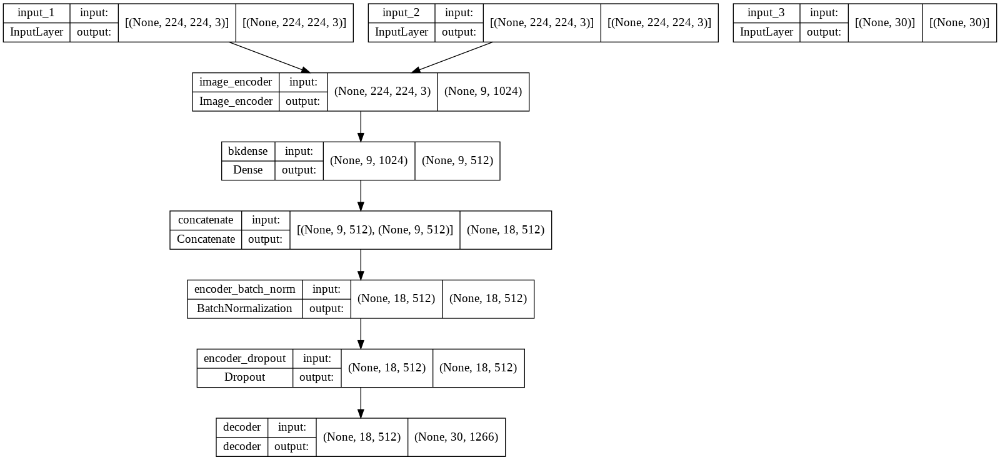

In [ ]:
keras.utils.plot_model(model, "globalAttentionModel.png", show_shapes=True)

In [ ]:
loss_func = tf.keras.losses.SparseCategoricalCrossentropy() 

def custom_loss(y_true, y_pred):
    #getting mask value to not consider those words which are not present in the true caption
    mask = tf.math.logical_not(tf.math.equal(y_true, 0))

    #calculating the loss
    loss_ = loss_func(y_true, y_pred)
    
    #converting mask dtype to loss_ dtype
    mask = tf.cast(mask, dtype=loss_.dtype)
    
    #applying the mask to loss
    loss_ = loss_*mask
    
    #returning mean over all the values
    return tf.reduce_mean(loss_)

optimizer = tf.keras.optimizers.Adam()   
model.compile(optimizer=optimizer,loss=custom_loss,metrics= ['accuracy'])

In [ ]:
tf.keras.backend.clear_session()
tb_filename = 'global_attention_encoder_decoder/'
tb_file = os.path.join(work_dir ,tb_filename)
model_filename = 'global_attention_encoder_decoder.h5'
model_save = os.path.join(work_dir , model_filename)
my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience = 5,
                                     verbose = 2
                                     ),
    tf.keras.callbacks.ModelCheckpoint(filepath=model_save,
                                       save_best_only = True,
                                      save_weights_only = True,
                                       verbose = 2
                                       ),
    tf.keras.callbacks.TensorBoard("/tmp/tb_logs"),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=2, min_lr=10**-7, verbose = 2)
                                   
]

In [ ]:
history = model.fit(train_dataloader,
          validation_data = val_dataloader,
          epochs = 10,
          callbacks = my_callbacks
          )

Epoch 1/10
36/36 [==============================] - ETA: 0s - loss: 3.7299 - accuracy: 0.4811 
Epoch 1: val_loss improved from inf to 2.51295, saving model to /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/global_attention_encoder_decoder.h5
36/36 [==============================] - 878s 23s/step - loss: 3.7299 - accuracy: 0.4811 - val_loss: 2.5129 - val_accuracy: 0.7464 - lr: 0.0010
Epoch 2/10
36/36 [==============================] - ETA: 0s - loss: 3.0220 - accuracy: 0.6246
Epoch 2: val_loss improved from 2.51295 to 2.26265, saving model to /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/global_attention_encoder_decoder.h5
36/36 [==============================] - 77s 2s/step - loss: 3.0220 - accuracy: 0.6246 - val_loss: 2.2626 - val_accuracy: 0.7695 - lr: 0.0010
Epoch 3/10
36/36 [==============================] - ETA: 0s - loss: 2.7160 - accuracy: 0.6645
Epoch 3: val_loss improved from 2.26265 to 2.16460, saving model to /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/global

In [ ]:
test_loss, test_acc = model.evaluate(test_dataloader)
print(test_loss)
print(test_acc)

5/5 [==============================] - 9s 2s/step - loss: 2.0057 - accuracy: 0.8013
2.00573992729187
0.8012666702270508


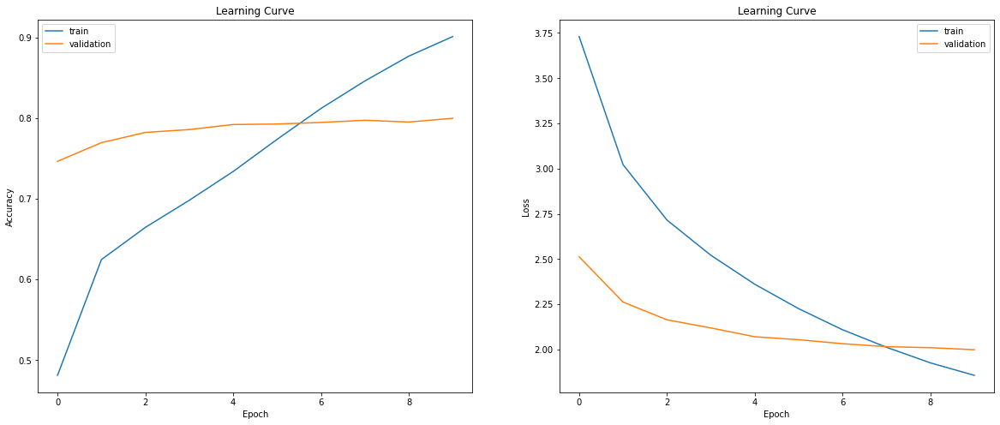

In [ ]:
draw_learning_curve(history)

In [ ]:
model_filename = 'global_attention_encoder_decoder.h5'
model_save = os.path.join(work_dir , model_filename)
model1 = tf.keras.Model(inputs = [image1,image2,caption], outputs = output)
model1.load_weights(model_save)

In [ ]:
# Load the TensorBoard notebook extension to see different execution trails for keras tuner.
%load_ext tensorboard
%tensorboard --logdir /tmp/tb_logs

<IPython.core.display.Javascript object>

## Performance

In [ ]:
train_loss, train_acc = model.evaluate(train_dataloader)
val_loss, val_acc = model.evaluate(val_dataloader)
test_loss, test_acc = model.evaluate(test_dataloader)

print('train set accuracy for Bahdanau Attention Encoder Decoder model: ', train_acc * 100)
print('validation set accuracy for Bahdanau Attention Encoder Decoder model: ', val_acc * 100)
print('test set accuracy for Bahdanau Attention Encoder Decoder model : ', test_acc * 100)

5/5 [==============================] - 9s 2s/step - loss: 2.0060 - accuracy: 0.8008
train set accuracy for Bahdanau Attention Encoder Decoder model:  87.67314553260803
validation set accuracy for Bahdanau Attention Encoder Decoder model:  79.89166378974915
test set accuracy for Bahdanau Attention Encoder Decoder model :  80.08000254631042


In [ ]:
# record the metrics for experiment 1
Exp = "Experiment 1"
Model = "Bahdanau Attention - Encoder Decoder"
results = pd.DataFrame(columns = ['Exp_No', 'Model','Train-accuracy','val-accuracy', 'Test-Accuracy','Train-loss','val-loss', 'Test-loss'])
row = [Exp, Model, train_acc, val_acc, test_acc, train_loss, val_loss, test_loss]
results = results.append(pd.DataFrame([row], columns=results.columns), ignore_index=True)

In [ ]:
results

,Exp_No,Model,Train-accuracy,val-accuracy,Test-Accuracy,Train-loss,val-loss,Test-loss
0,Experiment 1,Bahdanau Attention - Encoder Decoder,0.876731,0.798917,0.8008,1.883588,1.999005,2.006024


##Greedy Search

In [ ]:
#Given paths to two x-ray images predicts the impression part of the x-ray in a greedy search algorithm
def greedy_search_predict(image1,image2,model = model1):
  image1 = cv2.imread(image1,cv2.IMREAD_UNCHANGED)/255 
  image2 = cv2.imread(image2,cv2.IMREAD_UNCHANGED)/255
  image1 = tf.expand_dims(cv2.resize(image1,input_size,interpolation = cv2.INTER_NEAREST),axis=0) #introduce batch and resize
  image2 = tf.expand_dims(cv2.resize(image2,input_size,interpolation = cv2.INTER_NEAREST),axis=0)
  image1 = model.get_layer('image_encoder')(image1)
  image2 = model.get_layer('image_encoder')(image2)
  image1 = model.get_layer('bkdense')(image1)
  image2 = model.get_layer('bkdense')(image2)

  concat = model.get_layer('concatenate')([image1,image2])
  enc_op = model.get_layer('encoder_batch_norm')(concat)  
  enc_op = model.get_layer('encoder_dropout')(enc_op) #this is the output from encoder


  decoder_h,decoder_c = tf.zeros_like(enc_op[:,0]),tf.zeros_like(enc_op[:,0])
  a = []
  pred = []
  for i in range(max_pad):
    if i==0: #if first word
      caption = np.array(tokenizer.texts_to_sequences(['<cls>'])) #shape: (1,1)
    output,decoder_h,attention_weights = model.get_layer('decoder').onestepdecoder(caption,enc_op,decoder_h)#,decoder_c) decoder_c,

    #prediction
    max_prob = tf.argmax(output,axis=-1)  #tf.Tensor of shape = (1,1)
    caption = np.array([max_prob]) #will be sent to onstepdecoder for next iteration
    if max_prob==np.squeeze(tokenizer.texts_to_sequences(['<end>'])): 
      break;
    else:
      a.append(tf.squeeze(max_prob).numpy())
  return tokenizer.sequences_to_texts([a])[0] #here output would be 1,1 so subscripting to open the array

In [ ]:
%%time
k = -2
image1,image2 = test_data.image_1.iloc[k],test_data.image_2.iloc[k]
print(greedy_search_predict(image1,image2,model1))

no acute cardiopulmonary abnormality .
CPU times: user 1.4 s, sys: 40.6 ms, total: 1.44 s
Wall time: 2.04 s


In [ ]:
# Given a reference and prediction string, outputs the 1-gram,2-gram,3-gram and 4-gram bleu scores
def get_bleu(reference,prediction):
  reference = [reference.split()] #should be in an array (cos of multiple references can be there here only 1)
  prediction = prediction.split()
  bleu1 = sentence_bleu(reference,prediction,weights = (1,0,0,0))
  bleu2 = sentence_bleu(reference,prediction,weights = (0.5,0.5,0,0))
  bleu3 = sentence_bleu(reference,prediction,weights = (0.33,0.33,0.33,0))
  bleu4 = sentence_bleu(reference,prediction,weights = (0.25,0.25,0.25,0.25))

  return bleu1,bleu2,bleu3,bleu4

In [ ]:
#calculate mean bleu scores for every datapoint
def mean_bleu(test,predict,model=model1,**kwargs):
  if kwargs!=None:
    top_k = kwargs.get('top_k')
  else:
    top_k = None
  bleu1,bleu2,bleu3,bleu4 = [],[],[],[]
  for index,data in test.iterrows():
    if top_k==None:
      predict_val = predict(data['image_1'],data['image_2'],model = model) #predicted sentence
    else:
      predict_val = predict(data['image_1'],data['image_2'],model = model,top_k = top_k)
    true = data.impression
    _ = get_bleu(true,predict_val)
    bleu1.append(_[0])
    bleu2.append(_[1])
    bleu3.append(_[2])
    bleu4.append(_[3])
  return np.array(bleu1).mean(),np.array(bleu2).mean(),np.array(bleu3).mean(),np.array(bleu4).mean()

In [ ]:
%%time
_ = mean_bleu(test_data,greedy_search_predict)

CPU times: user 2min 42s, sys: 2.51 s, total: 2min 44s
Wall time: 7min 21s


In [ ]:
k = list(_)
index = 'greedy search'
result = pd.DataFrame([k],columns = ["bleu1","bleu2","bleu3","bleu4"],index = [index])
result

,bleu1,bleu2,bleu3,bleu4
greedy search,0.312697,0.3165,0.349837,0.386725


## Beam Search

In [ ]:
def encoder_op(image1,image2,model = model1):
  """
  Given image1 and image2 filepath, outputs
  their backbone features which will be input
  to the decoder
  """
  image1 = cv2.imread(image1,cv2.IMREAD_UNCHANGED)/255 
  image2 = cv2.imread(image2,cv2.IMREAD_UNCHANGED)/255 
  image1 = tf.expand_dims(cv2.resize(image1,input_size,interpolation = cv2.INTER_NEAREST),axis=0) #introduce batch and resize
  image2 = tf.expand_dims(cv2.resize(image2,input_size,interpolation = cv2.INTER_NEAREST),axis=0)
  
  image1 = model.get_layer('image_encoder')(image1) #output from chexnet
  image1 = model.get_layer('bkdense')(image1)
  image2 = model.get_layer('image_encoder')(image2)
  image2 = model.get_layer('bkdense')(image2)

  concat = model.get_layer('concatenate')([image1,image2])
  concat = model.get_layer('encoder_batch_norm')(concat)
  concat = model.get_layer('encoder_dropout')(concat)
  return concat

In [ ]:
def beam_search_predict(image1,image2,top_k=3,max_pad = max_pad,model = model1):
  """
  Given image1, image2 get the top
  beam search predicted sentence
  """
  k = top_k
  cls_token = tokenizer.texts_to_sequences(['<cls>'])[0] #[3]
  enc_op = encoder_op(image1,image2)
  states = tf.zeros_like(enc_op[:,0]) #state_h only
  seq_score = [[cls_token,0,states]] #[[[3], 0]]
  finished_seq_score = []
  for i in range(max_pad): #traverse through all lengths
    all_candidates = [] #stores all the top k seq along with their scores
    new_seq_score = [] #stores the seq_score which does not have <end> in them
    for s in seq_score: #traverse for all top k sequences
      text_input = s[0][-1] #getting the last predicted output
      states = s[2]
      caption = np.array([[text_input]]) #ip must be in shape (batch_size,seq length,dim)
      output,states,attention_weights =  model.get_layer('decoder').onestepdecoder(caption,enc_op,states) #here output has shape (1,vocab_size)
      top_words = tf.argsort(output[0],direction = 'DESCENDING')[:k] #get the top k words

      seq,score,_ = s
      for t in top_words.numpy():
        #here we will update score with log of probabilities and subtracting(log of prob will be in negative)
        #here since its -(log), lower the score higher the prob
        candidates = [seq+[t],score-np.log(output[0][t].numpy()),states] #updating the score and seq
        all_candidates.append(candidates)
      seq_score = sorted(all_candidates,key = lambda l:l[1])[:k] #getting the top 3 sentences with high prob ie low score
      #checks for  <end> in each seq obtained
      count = 0
      end_token = tokenizer.word_index['<end>']
      for seq,score,state in seq_score:
        # print('seq,score',seq,score)
        if seq[-1] == end_token: #if last word of the seq is <end>
          finished_seq_score.append([seq,score])
          count+=1
        else:
          new_seq_score.append([seq,score,state])
      k-=count #substracting the no. of finished sentences from beam length
      seq_score = new_seq_score

      if seq_score==[]: #if null array
        break;
      else:
        continue;

  seq_score = finished_seq_score[-1]
  sentence = seq_score[0][1:-1] #here <cls> and <end> is here so not considering that
  score = seq_score[1]
      
  return tokenizer.sequences_to_texts([sentence])[0]

In [ ]:
%%time
k = -1
image1,image2 = test_data.image_1.iloc[k],test_data.image_2.iloc[k]
print(beam_search_predict(image1,image2))

no acute cardiopulmonary abnormality .
CPU times: user 2.7 s, sys: 149 ms, total: 2.85 s
Wall time: 2.39 s


In [ ]:
result

,bleu1,bleu2,bleu3,bleu4
greedy search,0.312697,0.3165,0.349837,0.386725


##Prediction

In [ ]:
%%time
test_data['bleu_1_gs'] = np.zeros(test_data.shape[0]) #greedy search
test_data['prediction_gs'] = np.zeros(test_data.shape[0]) #greedy search

for index,rows in test_data.iterrows():
  #greedy search
  predicted_text = greedy_search_predict(rows.image_1,rows.image_2,model1)
  test_data.loc[index,'prediction_gs'] = predicted_text
  reference = [rows['impression'].split()]
  test_data.loc[index,'bleu_1_gs'] = sentence_bleu(reference,predicted_text.split(),weights = (1,0,0,0))

CPU times: user 2min 39s, sys: 2.99 s, total: 2min 42s
Wall time: 2min 40s


In [ ]:
test_data['prediction_gs'].value_counts()*100/test_data.shape[0] #greedy search

no acute cardiopulmonary abnormality .                                                                                                                                         76.198934
no acute cardiopulmonary abnormalities .                                                                                                                                        4.973357
low lung volumes with minimal left basilar atelectasis .                                                                                                                        4.262877
cardiomegaly with surgical changes of cabg with numerous broken sternotomy and a sternotomy fragment noted in the posterior left pleural space .                                1.953819
low lung volumes with opacities consistent with focal atelectasis .                                                                                                             1.243339
cardiomegaly with mild central pulmonary vascular congestion .             

In [ ]:
  # Given image1. image2 paths, the model, top_k and the method of prediction returns the predicted caption
  # method: "greedy" or "g" for greedy search, "beam" or "b" for beam search
def final_caption_pred(image1,image2,method = "beam",top_k = 3,model=model1):
  if method in ['greedy','g']:
    pred_caption = greedy_search_predict(image1,image2,model)
  elif method in ['beam','b']:
    pred_caption = beam_search_predict(image1,image2,top_k = top_k,model = model)
  else:
    print("Enter 'b' or 'beam' for beam search and 'g' or 'greedy' for greedy search")
  
  return pred_caption

In [ ]:
def inference(image1,image2,true_caption,model=model1,top_k = None,image_size = (10,20)):
  image1_array = cv2.imread(image1,cv2.IMREAD_UNCHANGED)
  image2_array = cv2.imread(image2,cv2.IMREAD_UNCHANGED)
  if type(top_k)==int:
    top_k = [top_k] #changing it to list if top_k given is of int type
  greedy_caption = final_caption_pred(image1,image2,method='g',model=model) #getting the greedy search prediction

  #printing the 2 images
  plt.figure(figsize = image_size)
  plt.subplot(121)
  plt.imshow(image1_array)
  plt.axis("off")

  plt.subplot(122)
  plt.imshow(image2_array)
  plt.axis("off")
  plt.show()

  print("\nTrue caption: '%s'"%(true_caption))
  print("Predicted caption(greedy search): '%s'"%(greedy_caption))
  #beam search of top_k
  if top_k != None:
    for i in top_k:
      beam_caption = final_caption_pred(image1,image2,method='b',model=model,top_k = i)
      print("Predicted caption(beam search = %i): '%s'"%(i,beam_caption))


## Correct Caption

In [ ]:
test_data['bleu_1_gs']

0      0.654985
1      1.000000
2      0.600000
3      0.400000
4      0.600000
         ...   
558    0.179732
559    0.003663
560    0.245253
561    0.220728
562    0.200000
Name: bleu_1_gs, Length: 563, dtype: float64

1 )


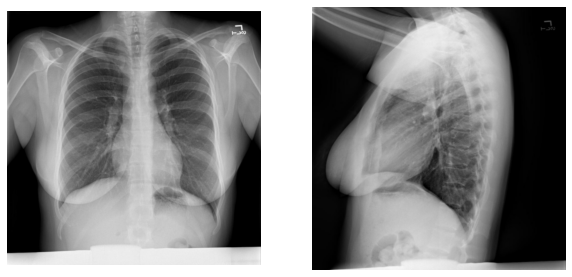


True caption: 'no acute cardiopulmonary disease .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


2 )


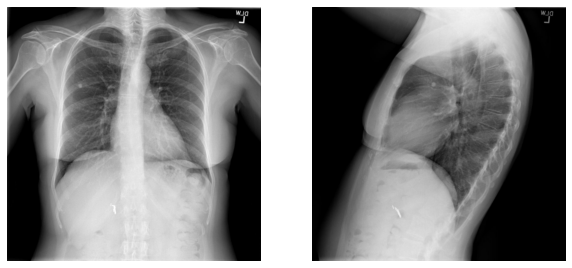


True caption: 'no acute pulmonary disease .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormalities .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormalities .'


3 )


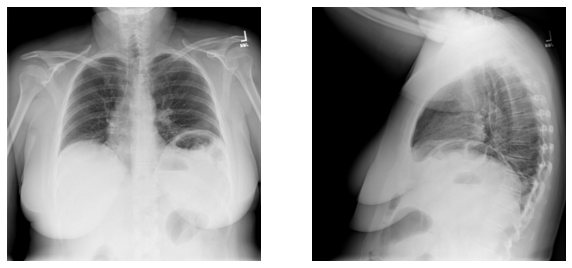


True caption: 'low lung volumes with streaky bibasilar opacities subsegmental atelectasis over infiltrate .'
Predicted caption(greedy search): 'low lung volumes with minimal left basilar atelectasis .'
Predicted caption(beam search = 1): 'low lung volumes with minimal left basilar atelectasis .'


4 )


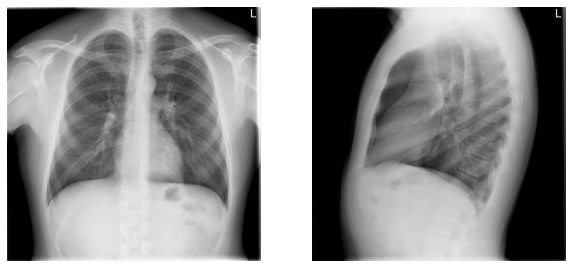


True caption: 'no evidence of active disease .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


5 )


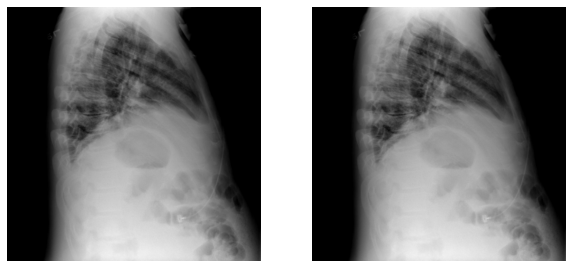


True caption: 'low lung volumes . no acute abnormality'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'




In [ ]:
# display top 5 images and captions with highest bleu score
i = test_data[(test_data['bleu_1_gs']>0.3)].sample(5).index
for j,k in enumerate(i):
  print(j+1,")")
  image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
  true_caption = test_data['impression'][k]
  inference(image1,image2,true_caption,top_k = 1)
  print("\n")

1 )


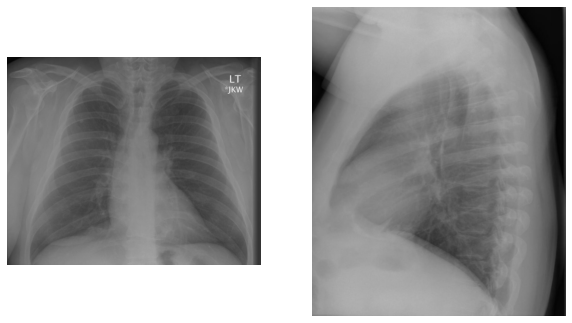


True caption: 'heart size normal . lungs clear . calcified mm right upper lobe granuloma .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


2 )


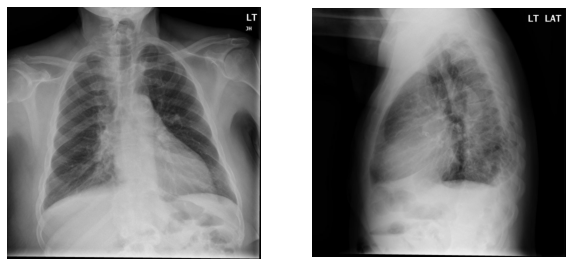


True caption: 'central pulmonary vascular congestion without edema consolidation . bilateral pleural effusions .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


3 )


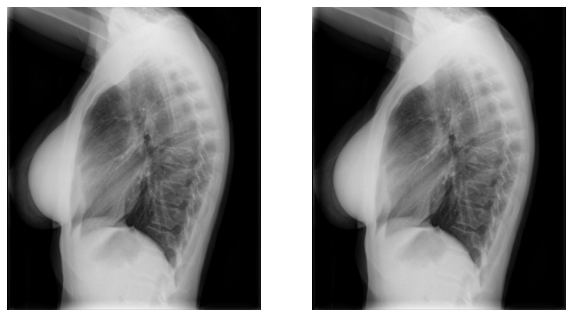


True caption: 'no acute cardiopulmonary abnormality .'
Predicted caption(greedy search): 'low lung volumes with minimal left basilar atelectasis .'
Predicted caption(beam search = 1): 'low lung volumes with minimal left basilar atelectasis .'


4 )


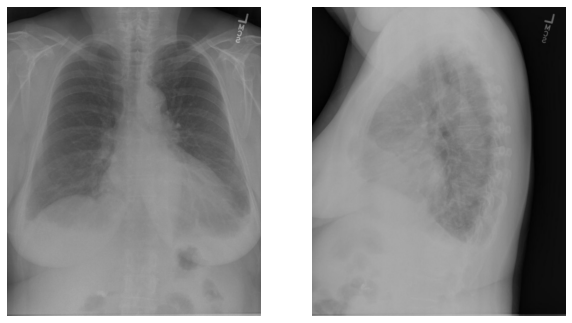


True caption: 'no cardiomegaly with bilateral small pleural effusions . decubitus x be informative . no evidence of pneumonia nodules or masses .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


5 )


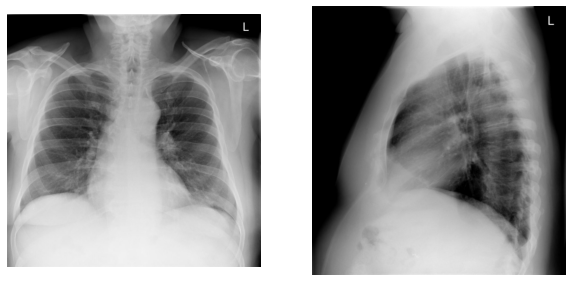


True caption: 'no evidence of active disease .'
Predicted caption(greedy search): 'low lung volumes with opacities consistent with focal atelectasis .'
Predicted caption(beam search = 1): 'low lung volumes with opacities consistent with focal atelectasis .'




In [ ]:
# display top 5 images and captions with lowest bleu score
i = test_data[test_data['bleu_1_gs']<=0.3].sample(5).index
for j,k in enumerate(i):
  print(j+1,")")
  image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
  true_caption = test_data['impression'][k]
  inference(image1,image2,true_caption,top_k = 1)
  print("\n")

##Random Comparision

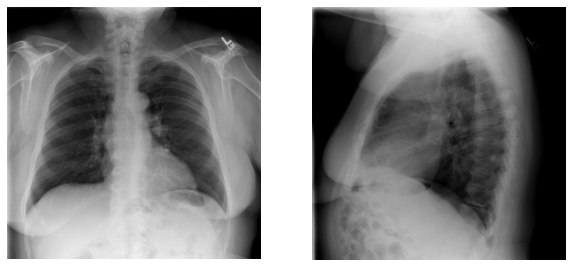


True caption: 'no acute findings'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


In [ ]:
k = 3
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

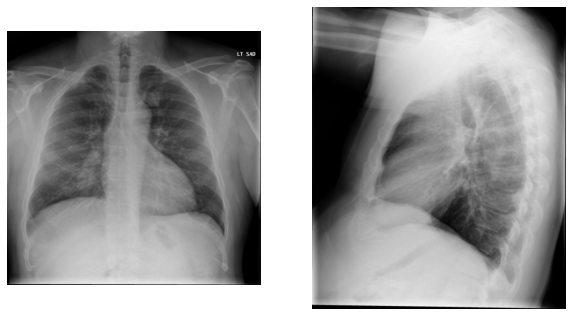


True caption: 'the heart size is normal . there is minimal fibronodular scarring right apex otherwise lungs clear'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


In [ ]:
k = 456
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

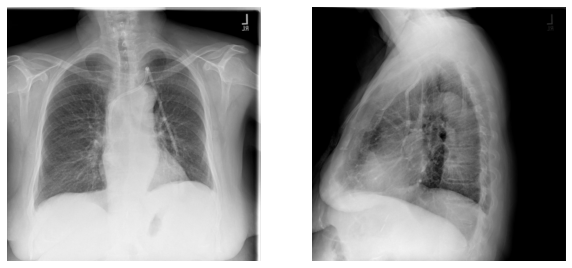


True caption: 'elevated left hemidiaphragm . no evidence of active disease .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


In [ ]:
k = 350
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

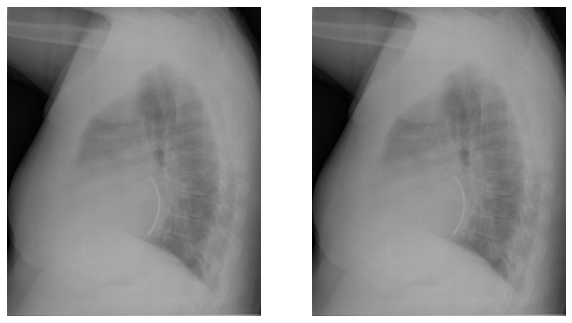


True caption: 'cardiomegaly with central pulmonary vascular congestion and no acute cardiopulmonary findings .'
Predicted caption(greedy search): 'cardiomegaly and pulmonary venous hypertension .'
Predicted caption(beam search = 1): 'cardiomegaly and pulmonary venous hypertension .'


In [ ]:
k = 560
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

In [ ]:
#Random image taken from pneumonia https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
random_image = work_dir + 'data/pneumonia dataset/person100_bacteria_475.jpeg'
true_caption = 'pneumonia detected'

random_image = Image.open(random_image).convert('RGB')
random_image.save("person100_bacteria_475_RGB.jpeg")

(762, 1106, 3)


<Figure size 720x1440 with 0 Axes>

(-0.5, 1105.5, 761.5, -0.5)

(-0.5, 1105.5, 761.5, -0.5)

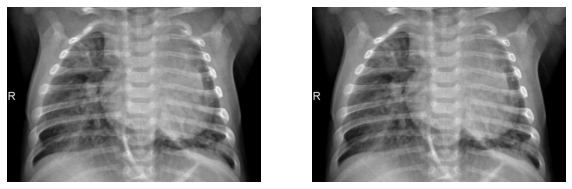


True caption: 'pneumonia detected'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'


In [ ]:
random_image = work_dir + 'person100_bacteria_475_RGB.jpeg'
true_caption = 'pneumonia detected'

random_image_array = cv2.imread(random_image,cv2.IMREAD_UNCHANGED)
print(random_image_array.shape)
greedy_caption = final_caption_pred(random_image,random_image,method='g',model=model) #getting the greedy search prediction

#printing the 2 images
plt.figure(figsize = (10,20))
plt.subplot(121)
plt.imshow(random_image_array)
plt.axis("off")

plt.subplot(122)
plt.imshow(random_image_array)
plt.axis("off")
plt.show()

print("\nTrue caption: '%s'"%(true_caption))
print("Predicted caption(greedy search): '%s'"%(greedy_caption))